# Data Load and imports:

In [1]:

import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, classification_report
from datetime import datetime
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
import lightgbm as lgb
import xgboost as xgb

In [2]:
df_train = pd.read_csv('train.csv')

# EDA

## General Information:

In [3]:
df_train.head(10)

,id,short_name,overall,potential,value_eur,wage_eur,birthday_date,height_cm,weight_kg,club_name,...,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,position
0,216302,E. García,71,71,1400000.0,10000,1989-12-28,176,73,Club Atlético de San Luis,...,65,66,65,14,11,12,12,12,NaN,LB
1,237867,D. Cancola,65,71,1000000.0,2000,1996-10-23,183,73,Ross County FC,...,65,61,58,10,13,7,6,11,NaN,LDM
2,253472,E. Kahl,65,77,1600000.0,2000,2001-09-27,178,69,Aarhus GF,...,60,58,59,10,10,8,10,11,NaN,LWB
3,223994,S. Mugoša,72,72,2300000.0,5000,1992-02-26,188,81,Incheon United FC,...,16,22,19,16,15,13,8,9,NaN,LS
4,251635,A. Țigănașu,65,65,525000.0,3000,1990-06-12,179,74,FC Botoşani,...,64,61,58,12,5,11,12,15,NaN,LB
5,219575,C. Bordacahar,68,68,1200000.0,500,1991-10-27,183,70,FBC Melgar,...,23,27,22,14,12,15,9,15,NaN,RW
6,200316,T. Horn,76,78,6500000.0,21000,1993-05-12,192,90,1. FC Köln,...,14,13,12,77,77,60,70,78,47.0,GK
7,222199,Zheng Kaimu,59,59,220000.0,2000,1992-01-28,186,80,Shijiazhuang Ever Bright F.C.,...,57,60,60,14,8,15,15,15,NaN,LCM
8,234172,B. Bese,69,69,1300000.0,7000,1994-05-06,188,84,Oud-Heverlee Leuven,...,60,66,61,11,7,9,14,15,NaN,RM
9,233196,Li Hang,63,63,400000.0,3000,1989-09-19,182,77,Wuhan FC,...,58,57,55,7,11,15,7,8,NaN,RCM


In [4]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6895 entries, 0 to 6894
Data columns (total 70 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           6895 non-null   int64  
 1   short_name                   6895 non-null   object 
 2   overall                      6895 non-null   int64  
 3   potential                    6895 non-null   int64  
 4   value_eur                    6893 non-null   float64
 5   wage_eur                     6895 non-null   int64  
 6   birthday_date                6895 non-null   object 
 7   height_cm                    6895 non-null   int64  
 8   weight_kg                    6895 non-null   int64  
 9   club_name                    6895 non-null   object 
 10  league_name                  6895 non-null   object 
 11  league_level                 6895 non-null   int64  
 12  club_jersey_number           6895 non-null   int64  
 13  club_loaned_from  

## Null Values Visualization:

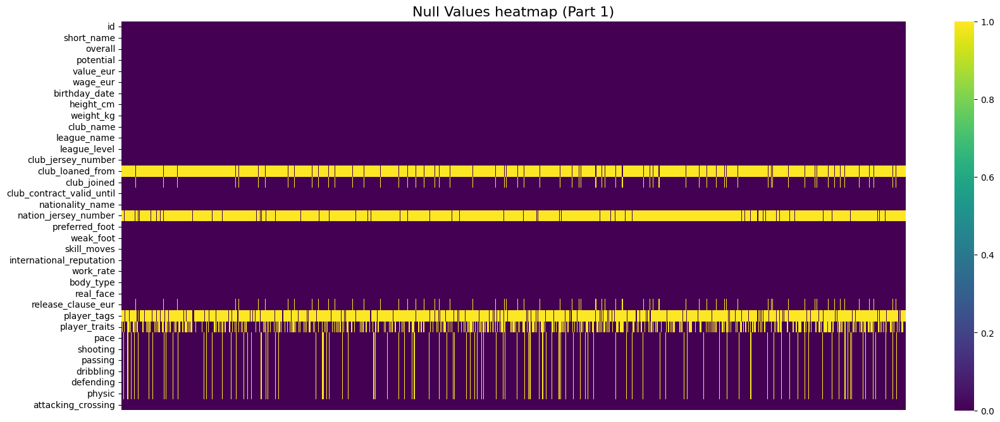

In [5]:
plt.figure(figsize=(20, 8))
sns.heatmap(df_train.isnull().iloc[:, :len(df_train.columns)//2].T, 
            cbar=True, 
            cmap='viridis',  
            yticklabels=1,
            xticklabels=False)
plt.xticks(rotation=45, fontsize=8)
plt.title('Null Values heatmap (Part 1)', fontsize=16)
plt.show()


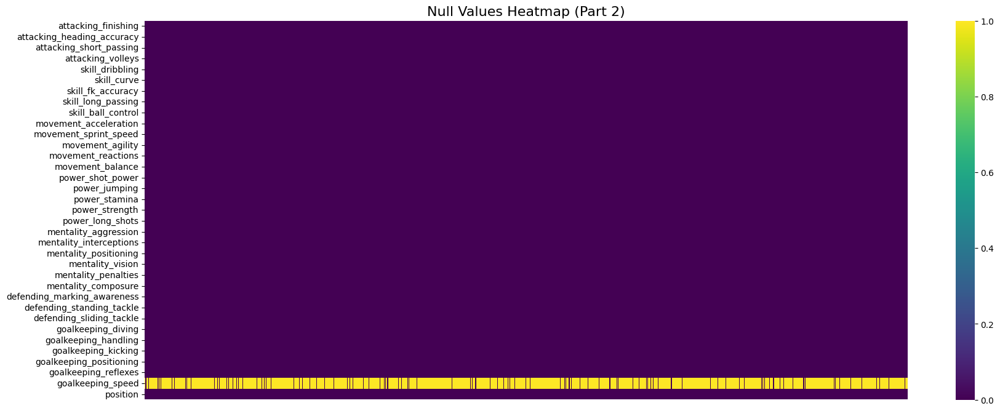

In [6]:

plt.figure(figsize=(20, 8))
sns.heatmap(df_train.isnull().iloc[:, len(df_train.columns)//2:].T, 
            cbar=True, 
            cmap='viridis',  
            yticklabels=1,
            xticklabels=False)
plt.xticks(rotation=45, fontsize=8)
plt.title('Null Values Heatmap (Part 2)', fontsize=16)
plt.show()

## Correlation analysis:

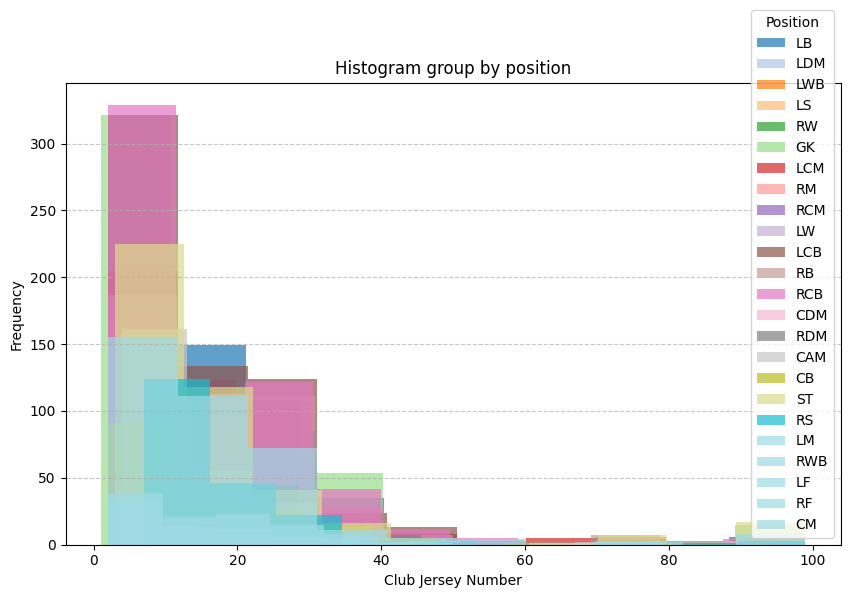

In [7]:
import matplotlib.pyplot as plt
import pandas as pd

positions = df_train['position'].unique()
colors = plt.cm.tab20(range(len(positions)))

plt.figure(figsize=(10, 6))
for pos, color in zip(positions, colors):
    subset = df_train[df_train['position'] == pos]
    plt.hist(subset['club_jersey_number'], bins=10, alpha=0.7, label=pos, color=color)

plt.xlabel('Club Jersey Number')
plt.ylabel('Frequency')
plt.title('Histogram group by position')
plt.legend(title='Position')
plt.grid(axis='y', linestyle='--', alpha=0.7)


plt.show()

plt.show()

In [8]:
frequency = (
    df_train.groupby(['position', 'club_jersey_number'])
    .size()
    .reset_index(name='frequency')
    .sort_values(by='frequency', ascending=False)
)

print(frequency)

    position  club_jersey_number  frequency
141       GK                   1        319
924       ST                   9        153
566       RB                   2        109
619      RCB                   4         97
196       LB                   3         92
..       ...                 ...        ...
242       LB                  90          1
243       LB                  92          1
244       LB                  93          1
245       LB                  94          1
739      RDM                  30          1

[967 rows x 3 columns]


it seems that the goalkeeper usually wears the jersey number 1, but since we can already identify it by other feature, the jersey number becomes irrelevant.

In [9]:

numerical_features = df_train.select_dtypes(include=['number']).columns.tolist()
categorical_features = df_train.select_dtypes(include=['object', 'category']).columns.tolist()


numerical_features = [col for col in numerical_features if col != 'position']
categorical_features = [col for col in categorical_features if col != 'position']

print("Numerical features:", numerical_features)
print("Categorical Features:", categorical_features)

Numerical features: ['id', 'overall', 'potential', 'value_eur', 'wage_eur', 'height_cm', 'weight_kg', 'league_level', 'club_jersey_number', 'club_contract_valid_until', 'nation_jersey_number', 'weak_foot', 'skill_moves', 'international_reputation', 'release_clause_eur', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalk

# Pre-Processing:

## Imputation of missing values:

Since every Goalkeeper has a value of the feature goalkeeping_speed but no value on pace, shooting, passing, dribbling, defending and physic.

In [10]:
df_train.loc[df_train['goalkeeping_speed'].isna(), ['goalkeeping_speed']] = 0 
df_train.loc[df_train['goalkeeping_speed'] != 0, ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']] = 0

## Feature engineering

Creating an age column based on birthday_date column.

In [11]:
df_train['birthday_date'] = pd.to_datetime(df_train['birthday_date'], errors='coerce')

current_year = datetime.now().year
df_train['age'] = current_year - df_train['birthday_date'].dt.year

## Encoding:

In [12]:
df_train = pd.get_dummies(df_train, columns=['preferred_foot'], drop_first=True)

## Dropping poorly relevant features:

The money related variables are not relevant to determine the position of the player. 

All the goalkeeper related variables except goalkeeping_speed can be discarted because this one is the one that defines the goalkeeped label. 

All date and club related variables are not relevant, beside the featured age that was created before. 

Tags and trait has high number of missing values and poor ammount of information to be inputed.

In [13]:
columnt_to_drop = [ 
                   'id',
                   'birthday_date',
                   'short_name',
                   'value_eur',
                   'wage_eur',
                   'club_name',
                   'league_name',
                   'league_level',
                   'club_jersey_number',
                   'club_loaned_from',
                   'club_joined',
                   'club_contract_valid_until',
                   'nationality_name',
                   'nation_jersey_number',
                   'international_reputation',
                   'work_rate',
                   'body_type',
                   'real_face',
                   'release_clause_eur',
                   'player_tags',
                   'player_traits',
                   'goalkeeping_handling',
                   'goalkeeping_kicking',
                   'goalkeeping_positioning',
                   'goalkeeping_reflexes',
                   'goalkeeping_diving'
                   ]

df_train = df_train.drop(columnt_to_drop, axis=1)

# Models Testing:

## Random Forest:

In [14]:
X = df_train.drop(['position'], axis=1)
y = df_train['position']

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestClassifier(random_state=42)

### Hyperparameter Tunning:

In [16]:
param_grid = {
    'n_estimators': [50, 100, 200],  
    'max_depth': [None, 10, 20, 30],  
    'min_samples_split': [2, 5, 10] 
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=cv, scoring='f1_weighted', n_jobs=-1)

grid_search.fit(X_train, y_train)

print(f"Best Hyperparameters: {grid_search.best_params_}")
print(f"Best CV average score: {grid_search.best_score_:.4f}")

best_rf_model = grid_search.best_estimator_

y_pred = best_rf_model.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 100}
Best CV average score: 0.4015
Classification Report:
              precision    recall  f1-score   support

         CAM       0.37      0.29      0.32        56
          CB       0.00      0.00      0.00        41
         CDM       0.67      0.06      0.11        35
          CM       0.00      0.00      0.00        18
          GK       1.00      1.00      1.00       122
          LB       0.56      0.78      0.65        83
         LCB       0.43      0.43      0.43       102
         LCM       0.28      0.39      0.33        82
         LDM       0.00      0.00      0.00        41
          LF       0.00      0.00      0.00         6
          LM       0.27      0.33      0.30        69
          LS       0.25      0.02      0.04        44
          LW       0.25      0.11      0.15        27
         LWB       0.00      0.00      0.00        20
          RB       0.54      0.80      0.65        

/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

## LightGBM:

In [17]:
lgb_model = lgb.LGBMClassifier(random_state=42)

### Hyperparameter Tunning:

In [18]:
param_grid = {
    'n_estimators': [50],          
    'learning_rate': [ 0.1, 0.8],  
    'max_depth': [ 1, 5],            
    'num_leaves': [31, 50],             
    'min_child_samples': [10, 20],       
    'colsample_bytree': [0.8, 1.0]           
}

grid_search = GridSearchCV(
    estimator=lgb_model,
    param_grid=param_grid,
    cv=3,                       
    scoring='f1_weighted',      
    verbose=1,                  
    n_jobs=-1                   
)

grid_search.fit(X_train, y_train)


print("Best Hyperparameters:", grid_search.best_params_)
print("Best Average CV score:", grid_search.best_score_)


best_lgb_model = grid_search.best_estimator_

y_pred = best_lgb_model.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

Fitting 3 folds for each of 32 candidates, totalling 96 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2891
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004305 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2898
[LightGBM] [Info] Number of data points in the train set: 3677, number of used features: 44
[LightGBM] [Info] Number of data points in the train set: 3677, number of used features: 44
[LightGBM] [Info] Start training from score -3.282599
[LightGBM] [Info] Start training from score -3.282599
[LightGBM] [Info] Start training from score -3.779036
[LightGBM] [Info] Start training from score -3.779036
[LightGBM] [Info] Start training from score -3.866047
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00670

/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

## XGBoost:

In [19]:
label_encoder_xgb =LabelEncoder()
y_train_encoded = label_encoder_xgb.fit_transform(y_train)
y_test_encoded = label_encoder_xgb.transform(y_test)

In [20]:
xgb_model = xgb.XGBClassifier(use_label_encoder=False, random_state=42, eval_metric="logloss")

param_grid = {
    'n_estimators': [50, 100],            
    'learning_rate': [0.1, 0.2],         
    'max_depth': [3, 5],                 
    'subsample': [0.8],                  
    'colsample_bytree': [0.8],           
    'gamma': [0, 1],                     
    'reg_alpha': [0],                    
    'reg_lambda': [1]                    
}

grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=3,                      
    scoring='f1_weighted',     
    verbose=1,                 
    n_jobs=-1                  
)

grid_search.fit(X_train, y_train_encoded)

print("Best Hyperparameters", grid_search.best_params_)
print(f"Best CV Score: {grid_search.best_score_:.4f}")


best_xgb_model = grid_search.best_estimator_

y_pred = best_xgb_model.predict(X_test)

print("Classification Report:")
print(classification_report(y_test_encoded, y_pred))

Fitting 3 folds for each of 16 candidates, totalling 48 fits


/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [10:41:16] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [10:41:16] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [10:41:16] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [10:41:16] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  w

Best Hyperparameters {'colsample_bytree': 0.8, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0, 'reg_lambda': 1, 'subsample': 0.8}
Best CV Score: 0.4091
Classification Report:
              precision    recall  f1-score   support

           0       0.34      0.32      0.33        56
           1       0.00      0.00      0.00        41
           2       0.20      0.06      0.09        35
           3       0.00      0.00      0.00        18
           4       1.00      1.00      1.00       122
           5       0.57      0.80      0.67        83
           6       0.47      0.38      0.42       102
           7       0.23      0.29      0.26        82
           8       0.06      0.02      0.04        41
           9       0.00      0.00      0.00         6
          10       0.29      0.35      0.32        69
          11       0.18      0.05      0.07        44
          12       0.20      0.11      0.14        27
          13       0.00      

/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/miniconda3/envs/brushup_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

# Predictions:

## Test data Pre-procesing:

In [21]:
df_test = pd.read_csv('test.csv')
original_df_test = pd.read_csv('test.csv')

In [22]:
df_test.loc[df_test['goalkeeping_speed'].isna(), ['goalkeeping_speed']] = 0 
df_test.loc[df_test['goalkeeping_speed'] != 0, ['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']] = 0

df_test['birthday_date'] = pd.to_datetime(df_test['birthday_date'], errors='coerce')
current_year = datetime.now().year
df_test['age'] = current_year - df_test['birthday_date'].dt.year

df_test = pd.get_dummies(df_test, columns=['preferred_foot'], drop_first=True)

columnt_to_drop = [ 
                   'id',
                   'birthday_date',
                   'short_name',
                   'value_eur',
                   'wage_eur',
                   'club_name',
                   'league_name',
                   'league_level',
                   'club_jersey_number',
                   'club_loaned_from',
                   'club_joined',
                   'club_contract_valid_until',
                   'nationality_name',
                   'nation_jersey_number',
                   'international_reputation',
                   'work_rate',
                   'body_type',
                   'real_face',
                   'release_clause_eur',
                   'player_tags',
                   'player_traits',
                   'goalkeeping_handling',
                   'goalkeeping_kicking',
                   'goalkeeping_positioning',
                   'goalkeeping_reflexes',
                   'goalkeeping_diving'
                   ]

df_test = df_test.drop(columnt_to_drop, axis=1)


## Random Forest Prediction:

In [23]:
rf_pred = best_rf_model.predict(df_test)
original_df_test["predicted_position"] = rf_pred
submission_rf = original_df_test[['id', 'predicted_position']]
submission_rf.to_csv("predictions_rf.csv",index=False)

## LightGBM Prediction:

In [24]:
lightGBM_pred = best_lgb_model.predict(df_test)
original_df_test["predicted_position"] = lightGBM_pred
submission_rf = original_df_test[['id', 'predicted_position']]
submission_rf.to_csv("predictions_lgbm.csv",index=False)

## XGBoost Prediction:

In [25]:
xgb_pred = best_xgb_model.predict(df_test)
xgb_pred = label_encoder_xgb.inverse_transform(xgb_pred)
original_df_test["predicted_position"] = xgb_pred
submission_rf = original_df_test[['id', 'predicted_position']]
submission_rf.to_csv("predictions_xgb.csv",index=False)